# SAM3 Instance Segmentation on Fruits360

SAM3 is Meta's unified foundation model for *promptable segmentation* — it builds on SAM 2
by adding **open-vocabulary text prompts**, allowing you to segment any of 270K+ named concepts
alongside the classic visual prompts (points, boxes, masks).

**Key difference from DINOv3 approach:** DINOv3 produces a single cosine-similarity heatmap that
must be manually thresholded and cannot separate touching instances. SAM3 outputs a precise,
per-instance binary mask with a learned IoU confidence score.

**Three prompt modes covered in this notebook:**

| Part | Model | Prompt | When to use |
|---|---|---|---|
| **1 — Text** | `Sam3Model` | Class name string | Open-vocabulary, no manual annotation |
| **2 — Bounding box** | `Sam3TrackerModel` | `[x1, y1, x2, y2]` | Semi-interactive, one object at a time |
| **3 — Point** | `Sam3TrackerModel` | `(x, y)` pixel click | Fastest, least robust |

All heavy functions live in `sam3_seg_utils.py` — this notebook only contains
configuration variables and calls to those functions.

**Prerequisites:** Fruits360 dataset extracted, `apple_pear_1.jpg` scene image,
`transformers >= 4.56.0`, `torch`, `pillow`, `matplotlib`.

In [1]:
%load_ext autoreload
%autoreload 2

## Setup

In [2]:
import pathlib
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from PIL import Image
import torch
import sys; sys.path.insert(0, ".")

In [3]:
%cd ~/Projects/cvi4ic-notebooks/12
from sam3_seg_utils import (
    MODEL_ID, INSTANCE_COLORS, _color_overlay, _fast_contour,
    load_sam3_model, load_tracker_model,
    segment_by_text, segment_by_bbox, segment_by_point,
    get_image_paths, find_class,
    show_text_segmentation, show_visual_segmentation,
    show_instance_grid, show_score_sweep,
    show_gallery_reference, show_multiclass_segmentation,
)
print("Imports OK.")

/home/azureuser/Projects/cvi4ic-notebooks/12/.venv/lib/python3.11/site-packages/IPython/core/magics/osm.py:393: UserWarning: This is now an optional IPython functionality, using bookmarks requires you to install the `pickleshare` library.
  bkms = self.shell.db.get('bookmarks', {})
/home/azureuser/Projects/cvi4ic-notebooks/12/.venv/lib/python3.11/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


/home/azureuser/Projects/cvi4ic-notebooks/12


Imports OK.


In [4]:
# ── Edit these two paths ───────────────────────────────────────────────────────
DATASET_PATH = pathlib.Path(r"../fruits-360-100x100")
SCENE_PATH   = pathlib.Path(r"apple_pear_1.jpg")
# ──────────────────────────────────────────────────────────────────────────────

TRAIN_ROOT = DATASET_PATH / "Training"
assert TRAIN_ROOT.exists(), f"Training/ not found under {DATASET_PATH}"
assert SCENE_PATH.exists(), f"Scene image not found: {SCENE_PATH}"

classes = sorted([d.name for d in TRAIN_ROOT.iterdir() if d.is_dir()])

scene_img      = Image.open(SCENE_PATH).convert("RGB")
orig_w, orig_h = scene_img.size
scene_arr      = np.array(scene_img)

print(f"Dataset: {len(classes)} classes")
print(f"Scene  : {SCENE_PATH.name}  {orig_w} × {orig_h} px")

Dataset: 261 classes
Scene  : apple_pear_1.jpg  4032 × 3024 px


## Authenticate with Hugging Face

SAM3 weights require a free Hugging Face account and an accepted model license.

1. Create an account at huggingface.co
2. Go to **Settings → Access Tokens → New token** (read permission is enough)
3. Accept the model license on the [facebook/sam3](https://huggingface.co/facebook/sam3) page
4. Paste your token in the cell below

In [ ]:
from huggingface_hub import login
token = "secret token"
login(token=token, add_to_git_credential=False)

## Load Models

SAM3 ships two distinct model heads:

| Class | Prompt types | Post-process call |
|---|---|---|
| `Sam3Model` | text, text + box/point | `post_process_instance_segmentation` |
| `Sam3TrackerModel` | point, box | `post_process_masks` |

We load both here so every mode in the notebook is ready to run.

In [7]:
print(torch.__version__)  
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device: {DEVICE}")

sam3, proc3       = load_sam3_model(MODEL_ID, DEVICE)     # text-prompted
tracker, proc_trk = load_tracker_model(MODEL_ID, DEVICE)  # visual-prompted

2.5.1+cu121
Device: cuda
Loading Sam3Model from facebook/sam3 on cuda ...


Loading weights:   0%|          | 0/1468 [00:00<?, ?it/s]

Sam3Model ready.
Loading Sam3TrackerModel from facebook/sam3 on cuda ...


[transformers] You are using a model of type `sam3_video` to instantiate a model of type `sam3_tracker`. This may be expected if you are loading a checkpoint that shares a subset of the architecture (e.g., loading a `sam2_video` checkpoint into `Sam2Model`), but is otherwise not supported and can yield errors. Please verify that the checkpoint is compatible with the model you are instantiating.


Loading weights:   0%|          | 0/685 [00:00<?, ?it/s]

Sam3TrackerModel ready.


---
## Part 1 — Text-Prompted Segmentation

SAM3's open-vocabulary text encoder matches the prompt against all patches in the
image and produces a mask for every detected instance. No reference images, no manual
boxes — just a class name string.

```
text prompt (e.g. "apple")
        │
        ▼  text encoder + mask decoder
N instance masks  +  IoU confidence scores
        │
        ▼  score threshold filter
final detections
```

We run inference at a **low threshold (0.1)** to collect all candidate masks, then
explore different filtering thresholds in Part 1b without re-running the model.

### 1a — Single Class

In [8]:
TEXT_PROMPT    = "apple"    # change to any fruit name present in the scene
SCORE_THRESHOLD = 0.50      # keep instances above this IoU confidence

In [9]:
all_dets, _ = segment_by_text(
    SCENE_PATH, sam3, proc3, TEXT_PROMPT, DEVICE, threshold=0.10
)
dets = [d for d in all_dets if d["score"] >= SCORE_THRESHOLD]

print(f"Total candidates (threshold=0.10) : {len(all_dets)}")
print(f"After filtering  (>= {SCORE_THRESHOLD})    : {len(dets)}")
for i, d in enumerate(dets):
    print(f"  #{i+1:2d}  score={d['score']:.4f}  "
          f"mask pixels={d['mask'].sum():,}  box={d['box'].astype(int).tolist()}")

Total candidates (threshold=0.10) : 24
After filtering  (>= 0.5)    : 19
  # 1  score=0.9666  mask pixels=335,844  box=[383, 1118, 1104, 1745]
  # 2  score=0.9663  mask pixels=276,334  box=[497, 268, 1160, 863]
  # 3  score=0.9657  mask pixels=473,833  box=[2836, 2117, 3591, 2922]
  # 4  score=0.9634  mask pixels=307,139  box=[2623, 219, 3287, 841]
  # 5  score=0.9628  mask pixels=496,895  box=[87, 2113, 930, 2918]
  # 6  score=0.9611  mask pixels=250,241  box=[1262, 264, 1821, 854]
  # 7  score=0.9602  mask pixels=378,113  box=[2665, 1060, 3403, 1757]
  # 8  score=0.9599  mask pixels=425,852  box=[1000, 2188, 1749, 2925]
  # 9  score=0.9592  mask pixels=425,332  box=[3122, 1581, 3940, 2243]
  #10  score=0.9565  mask pixels=315,685  box=[1176, 1084, 1805, 1728]
  #11  score=0.9546  mask pixels=258,434  box=[3017, 677, 3652, 1260]
  #12  score=0.9539  mask pixels=238,124  box=[1957, 292, 2500, 850]
  #13  score=0.9527  mask pixels=279,942  box=[857, 656, 1473, 1265]
  #14  score=0.9499 

Saved → sam3_text_single.png


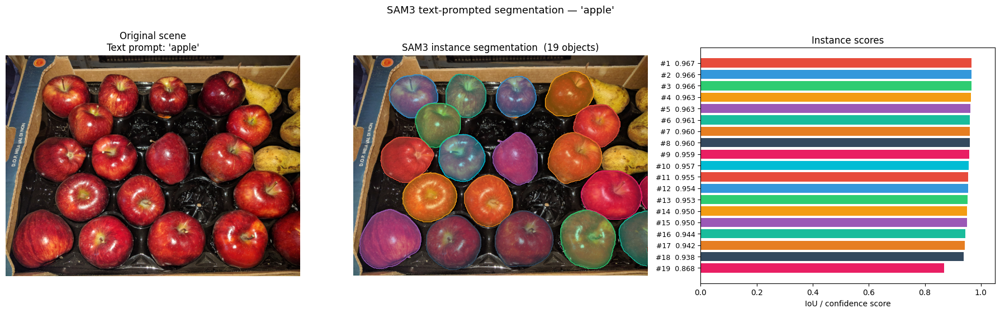

In [10]:
show_text_segmentation(
    scene_arr, dets, TEXT_PROMPT,
    save_path="sam3_text_single.png",
)

Saved → sam3_instance_grid.png


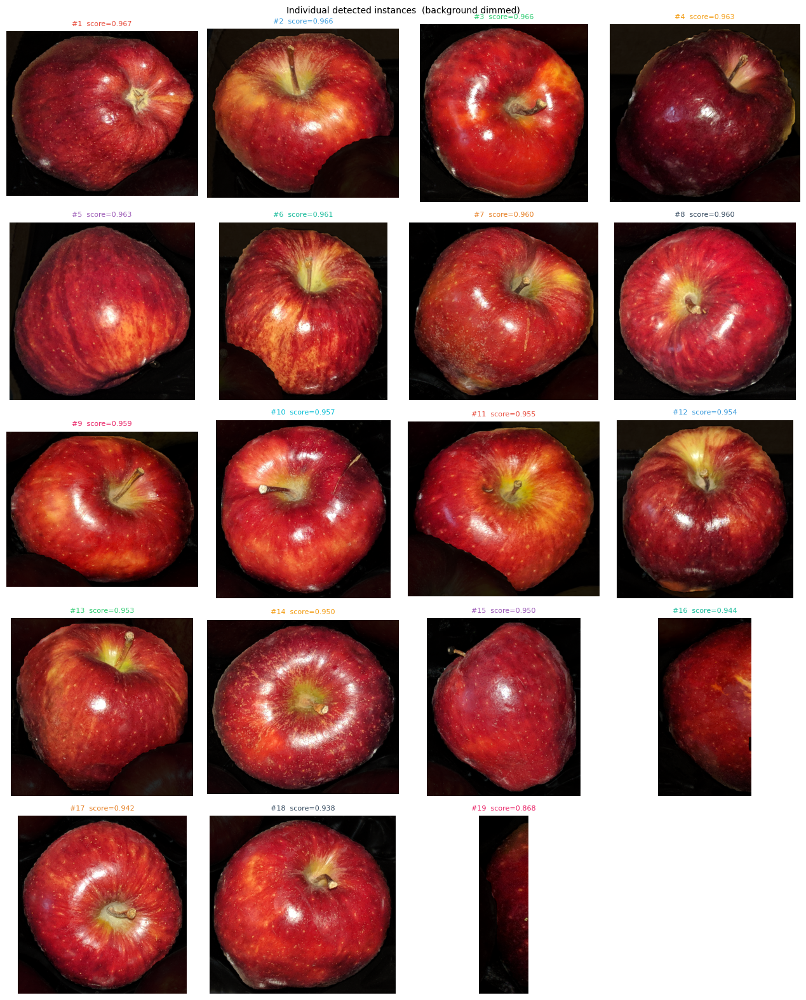

In [11]:
show_instance_grid(
    scene_arr, dets, n_cols=4,
    save_path="sam3_instance_grid.png",
)

### 1b — Open-Vocabulary Multi-Class Segmentation

Run a separate text query for each fruit type present in the scene. Because SAM3 is
trained on 270K+ concepts, it can distinguish "apple" from "pear" without any
task-specific fine-tuning.

In [12]:
# Adjust to the fruit classes visible in your scene
SCENE_CLASSES   = ["apple" ] # TODO
MULTICLASS_THR  = 0.50

'apple': 19 instance(s) after threshold
Saved → sam3_multiclass.png


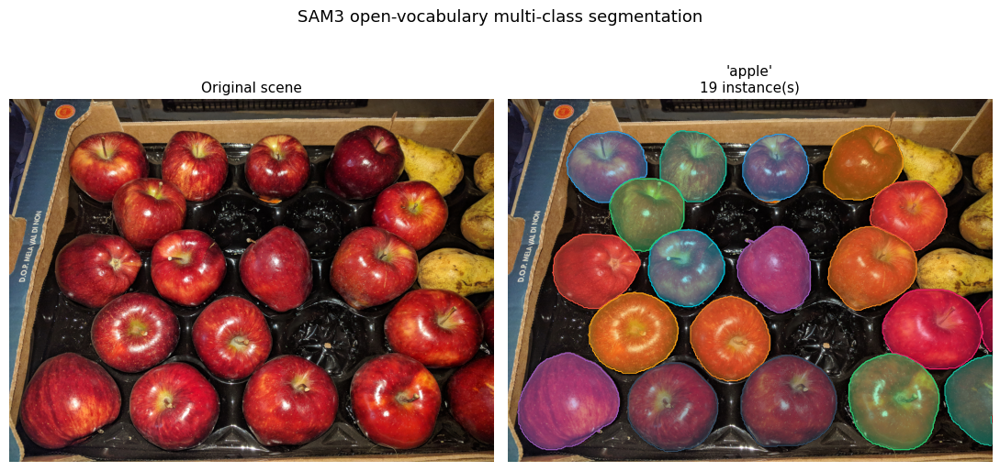

In [13]:
detections_per_class = {}
for cls in SCENE_CLASSES:
    all_d, _ = segment_by_text(
        SCENE_PATH, sam3, proc3, cls, DEVICE, threshold=0.10
    )
    detections_per_class[cls] = [d for d in all_d if d["score"] >= MULTICLASS_THR]
    print(f"'{cls}': {len(detections_per_class[cls])} instance(s) after threshold")

show_multiclass_segmentation(
    scene_arr, detections_per_class,
    save_path="sam3_multiclass.png",
)

### 1c — Gallery-Informed Text Prompt

The Fruits360 class names are already valid text concepts for SAM3. We can view the
reference images from the training split (as we did for the DINOv3 gallery prototype)
simply as context — then use the class name directly as the text prompt.

No feature extraction or prototype averaging is needed.

In [14]:
GALLERY_CLASS = "Apple Red"   # prefix match — change to any Fruits360 class
N_REF         = 6
GALLERY_THR   = 0.50

Using class: Apple Red 1
Saved → sam3_gallery_refs.png


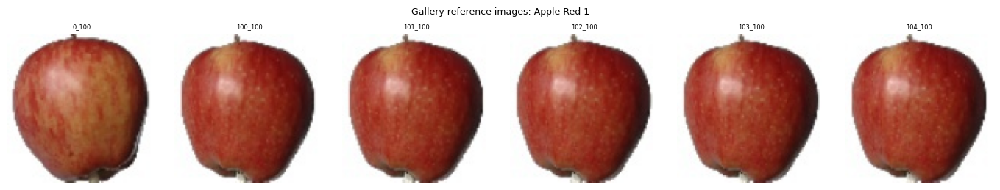

Text prompt derived from class: 'apple'
Saved → sam3_gallery_text.png


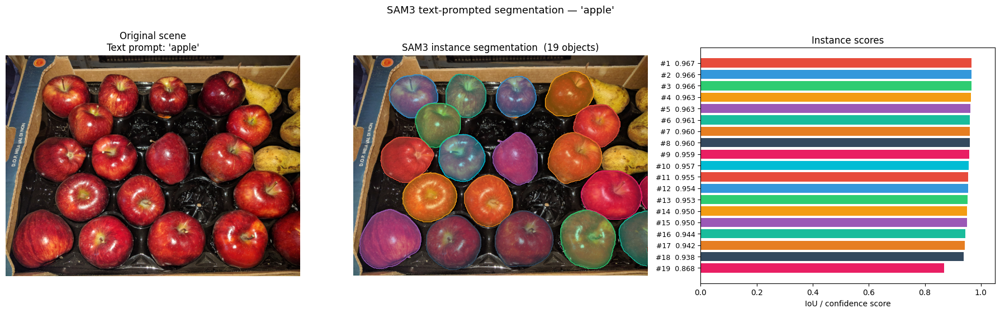

In [15]:
ref_class = find_class(GALLERY_CLASS, classes)
ref_paths = get_image_paths(TRAIN_ROOT, ref_class, N_REF)
print(f"Using class: {ref_class}")

show_gallery_reference(ref_paths, ref_class, save_path="sam3_gallery_refs.png")

# Use the base concept word (first token of the class name) as the text prompt
gallery_prompt = ref_class.split()[0].lower()   # e.g. "Apple Red" → "apple"
print(f"Text prompt derived from class: '{gallery_prompt}'")

gallery_dets, _ = segment_by_text(
    SCENE_PATH, sam3, proc3, gallery_prompt, DEVICE, threshold=0.10
)
gallery_dets = [d for d in gallery_dets if d["score"] >= GALLERY_THR]

show_text_segmentation(
    scene_arr, gallery_dets, gallery_prompt,
    save_path="sam3_gallery_text.png",
)

---
## Part 2 — Bounding Box Segmentation

Draw a rough bounding box around **one** fruit in the scene. `Sam3TrackerModel`
predicts a precise pixel-level mask for the object inside the box.

Advantages over the text mode:
- Works when the text concept is ambiguous or not in SAM3's vocabulary
- Targets a *specific* instance rather than all instances of a class
- Typically yields higher IoU for single-object queries

In [16]:
# [x1, y1, x2, y2] in original image pixels — draw a box around one fruit
QUERY_BOX = [1938, 1054, 2538, 1800]

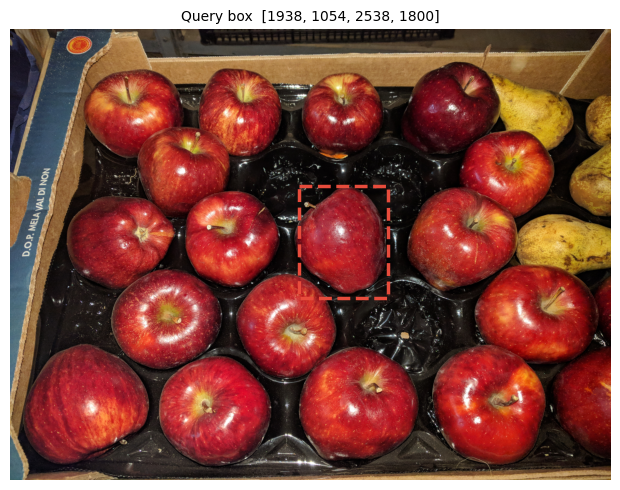

In [17]:
x1, y1, x2, y2 = QUERY_BOX
fig, ax = plt.subplots(figsize=(7, 5))
ax.imshow(scene_arr)
ax.add_patch(mpatches.Rectangle(
    (x1, y1), x2 - x1, y2 - y1,
    linewidth=2.5, edgecolor="#e74c3c", facecolor="none", linestyle="--"))
ax.set_title(f"Query box  [{x1}, {y1}, {x2}, {y2}]", fontsize=10)
ax.axis("off")
plt.tight_layout()
plt.show()

Mask pixels : 321,747 / 12,192,768
IoU score   : 0.9924
Saved → sam3_bbox.png


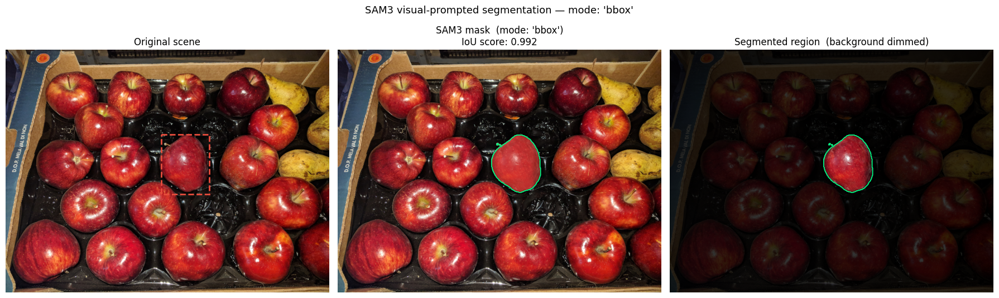

In [18]:
bbox_result, _ = segment_by_bbox(SCENE_PATH, tracker, proc_trk, QUERY_BOX, DEVICE)
print(f"Mask pixels : {bbox_result['mask'].sum():,} / {orig_w * orig_h:,}")
print(f"IoU score   : {bbox_result['score']:.4f}")

show_visual_segmentation(
    scene_arr, bbox_result, "bbox",
    query_box=QUERY_BOX,
    save_path="sam3_bbox.png",
)

---
## Part 3 — Point-Click Segmentation

Click a single pixel inside the target object. `Sam3TrackerModel` predicts the mask
for the object whose surface contains that pixel.

This is the fastest prompt mode but also the least robust: if the clicked pixel lands
on a shadow, specular highlight, or object boundary, the mask quality drops.
Use `multimask_output=True` (not shown here) to get three candidate masks and pick
the one with the highest IoU score.

In [19]:
# (x, y) in original image pixels — click inside the target fruit
QUERY_POINT = (2150, 1400)

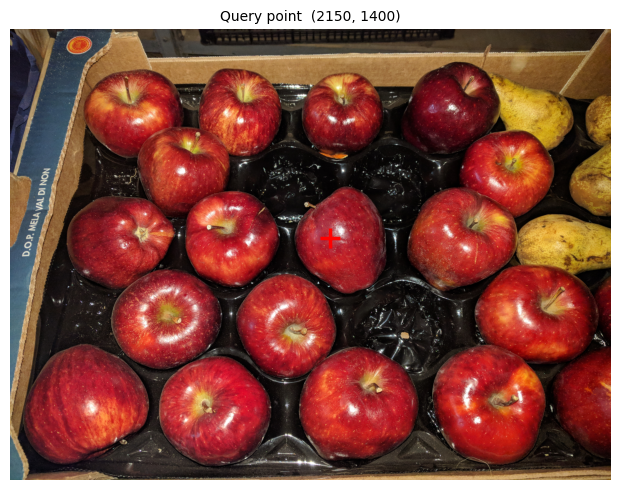

In [20]:
fig, ax = plt.subplots(figsize=(7, 5))
ax.imshow(scene_arr)
ax.plot(QUERY_POINT[0], QUERY_POINT[1], "r+", markersize=14, markeredgewidth=2.5)
ax.set_title(f"Query point  {QUERY_POINT}", fontsize=10)
ax.axis("off")
plt.tight_layout()
plt.show()

In [22]:
point_result, _ = segment_by_point(SCENE_PATH, tracker, proc_trk, QUERY_POINT, DEVICE)
print(f"Mask pixels : {point_result['mask'].sum():,} / {orig_w * orig_h:,}")
print(f"IoU score   : {point_result['score']:.4f}")

show_visual_segmentation(
    scene_arr, point_result, "point",
    query_point=QUERY_POINT,
    save_path="sam3_point.png",
)

TypeError: Sam3TrackerModel(
  (shared_image_embedding): Sam3TrackerPositionalEmbedding()
  (vision_encoder): Sam3VisionModel(
    (backbone): Sam3ViTModel(
      (embeddings): Sam3ViTEmbeddings(
        (patch_embeddings): Sam3ViTPatchEmbeddings(
          (projection): Conv2d(3, 1024, kernel_size=(14, 14), stride=(14, 14), bias=False)
        )
        (dropout): Dropout(p=0.0, inplace=False)
      )
      (layer_norm): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
      (layers): ModuleList(
        (0-31): 32 x Sam3ViTLayer(
          (layer_norm1): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
          (rotary_emb): Sam3ViTRotaryEmbedding()
          (attention): Sam3ViTRoPEAttention(
            (q_proj): Linear(in_features=1024, out_features=1024, bias=True)
            (k_proj): Linear(in_features=1024, out_features=1024, bias=True)
            (v_proj): Linear(in_features=1024, out_features=1024, bias=True)
            (o_proj): Linear(in_features=1024, out_features=1024, bias=True)
          )
          (layer_norm2): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
          (mlp): Sam3MLP(
            (activation_fn): GELUActivation()
            (fc1): Linear(in_features=1024, out_features=4736, bias=True)
            (fc2): Linear(in_features=4736, out_features=1024, bias=True)
            (dropout): Dropout(p=0.0, inplace=False)
          )
          (dropout): Dropout(p=0.0, inplace=False)
        )
      )
    )
    (neck): Sam3VisionNeck(
      (position_encoding): Sam3SinePositionEmbedding()
      (fpn_layers): ModuleList(
        (0): Sam3FPNLayer(
          (scale_layers): ModuleList(
            (0): ConvTranspose2d(1024, 512, kernel_size=(2, 2), stride=(2, 2))
            (1): GELU(approximate='none')
            (2): ConvTranspose2d(512, 256, kernel_size=(2, 2), stride=(2, 2))
          )
          (proj1): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
          (proj2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
        (1): Sam3FPNLayer(
          (scale_layers): ModuleList(
            (0): ConvTranspose2d(1024, 512, kernel_size=(2, 2), stride=(2, 2))
          )
          (proj1): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
          (proj2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
        (2): Sam3FPNLayer(
          (scale_layers): ModuleList()
          (proj1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
          (proj2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
        (3): Sam3FPNLayer(
          (scale_layers): ModuleList(
            (0): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
          )
          (proj1): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
          (proj2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        )
      )
    )
  )
  (prompt_encoder): Sam3TrackerPromptEncoder(
    (shared_embedding): Sam3TrackerPositionalEmbedding()
    (mask_embed): Sam3TrackerMaskEmbedding(
      (activation): GELUActivation()
      (conv1): Conv2d(1, 4, kernel_size=(2, 2), stride=(2, 2))
      (conv2): Conv2d(4, 16, kernel_size=(2, 2), stride=(2, 2))
      (conv3): Conv2d(16, 256, kernel_size=(1, 1), stride=(1, 1))
      (layer_norm1): Sam3TrackerLayerNorm((4,), eps=1e-06, elementwise_affine=True)
      (layer_norm2): Sam3TrackerLayerNorm((16,), eps=1e-06, elementwise_affine=True)
    )
    (no_mask_embed): Embedding(1, 256)
    (point_embed): Embedding(4, 256)
    (not_a_point_embed): Embedding(1, 256)
  )
  (mask_decoder): Sam3TrackerMaskDecoder(
    (iou_token): Embedding(1, 256)
    (mask_tokens): Embedding(4, 256)
    (transformer): Sam3TrackerTwoWayTransformer(
      (layers): ModuleList(
        (0-1): 2 x Sam3TrackerTwoWayAttentionBlock(
          (self_attn): Sam3TrackerAttention(
            (q_proj): Linear(in_features=256, out_features=256, bias=True)
            (k_proj): Linear(in_features=256, out_features=256, bias=True)
            (v_proj): Linear(in_features=256, out_features=256, bias=True)
            (o_proj): Linear(in_features=256, out_features=256, bias=True)
          )
          (layer_norm1): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
          (cross_attn_token_to_image): Sam3TrackerAttention(
            (q_proj): Linear(in_features=256, out_features=128, bias=True)
            (k_proj): Linear(in_features=256, out_features=128, bias=True)
            (v_proj): Linear(in_features=256, out_features=128, bias=True)
            (o_proj): Linear(in_features=128, out_features=256, bias=True)
          )
          (layer_norm2): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
          (mlp): Sam3TrackerFeedForward(
            (activation): ReLU()
            (proj_in): Linear(in_features=256, out_features=2048, bias=True)
            (proj_out): Linear(in_features=2048, out_features=256, bias=True)
            (layers): ModuleList()
          )
          (layer_norm3): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
          (layer_norm4): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
          (cross_attn_image_to_token): Sam3TrackerAttention(
            (q_proj): Linear(in_features=256, out_features=128, bias=True)
            (k_proj): Linear(in_features=256, out_features=128, bias=True)
            (v_proj): Linear(in_features=256, out_features=128, bias=True)
            (o_proj): Linear(in_features=128, out_features=256, bias=True)
          )
        )
      )
      (final_attn_token_to_image): Sam3TrackerAttention(
        (q_proj): Linear(in_features=256, out_features=128, bias=True)
        (k_proj): Linear(in_features=256, out_features=128, bias=True)
        (v_proj): Linear(in_features=256, out_features=128, bias=True)
        (o_proj): Linear(in_features=128, out_features=256, bias=True)
      )
      (layer_norm_final_attn): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
    )
    (upscale_conv1): ConvTranspose2d(256, 64, kernel_size=(2, 2), stride=(2, 2))
    (upscale_conv2): ConvTranspose2d(64, 32, kernel_size=(2, 2), stride=(2, 2))
    (upscale_layer_norm): Sam3TrackerLayerNorm((64,), eps=1e-06, elementwise_affine=True)
    (activation): GELU(approximate='none')
    (output_hypernetworks_mlps): ModuleList(
      (0-3): 4 x Sam3TrackerFeedForward(
        (activation): ReLU()
        (proj_in): Linear(in_features=256, out_features=256, bias=True)
        (proj_out): Linear(in_features=256, out_features=32, bias=True)
        (layers): ModuleList(
          (0): Linear(in_features=256, out_features=256, bias=True)
        )
      )
    )
    (iou_prediction_head): Sam3TrackerFeedForward(
      (activation): ReLU()
      (proj_in): Linear(in_features=256, out_features=256, bias=True)
      (proj_out): Linear(in_features=256, out_features=4, bias=True)
      (layers): ModuleList(
        (0): Linear(in_features=256, out_features=256, bias=True)
      )
    )
    (conv_s0): Conv2d(256, 32, kernel_size=(1, 1), stride=(1, 1))
    (conv_s1): Conv2d(256, 64, kernel_size=(1, 1), stride=(1, 1))
    (obj_score_token): Embedding(1, 256)
    (pred_obj_score_head): Sam3TrackerFeedForward(
      (activation): ReLU()
      (proj_in): Linear(in_features=256, out_features=256, bias=True)
      (proj_out): Linear(in_features=256, out_features=1, bias=True)
      (layers): ModuleList(
        (0): Linear(in_features=256, out_features=256, bias=True)
      )
    )
  )
) argument after ** must be a mapping, not NoneType

### 3a — Positive + Negative Point Refinement

Pass multiple points: positive (label=1) to include, negative (label=0) to exclude.
This manually steers the mask away from background or adjacent objects.

In [23]:
# Add a negative point outside the target fruit to prevent mask bleed
POSITIVE_POINT  = (2150, 1400)   # inside the target
NEGATIVE_POINT  = (2600, 1400)   # background or adjacent fruit

IoU score (refined) : 0.9874


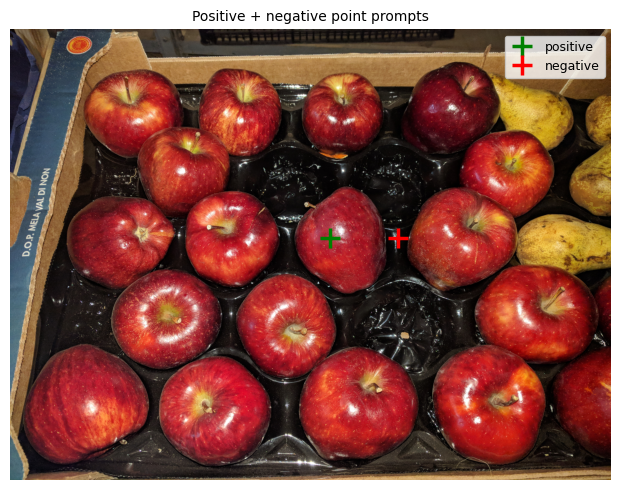

Saved → sam3_point_refined.png


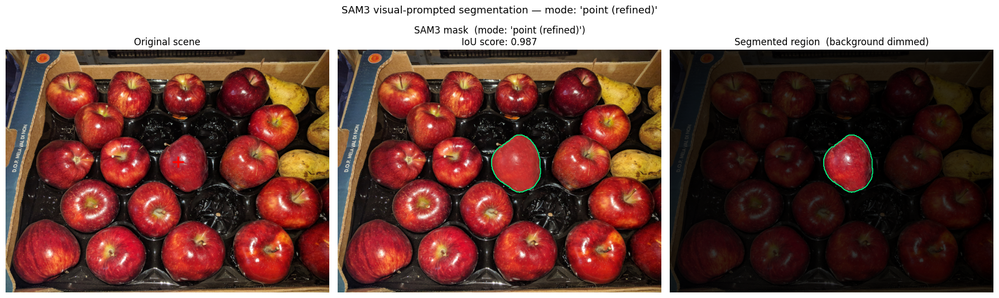

In [25]:
from sam3_seg_utils import _tracker_score

refined_img = Image.open(SCENE_PATH).convert("RGB")
refined_inputs = proc_trk(
    images=refined_img,
    input_points=[[[
        [POSITIVE_POINT[0], POSITIVE_POINT[1]],
        [NEGATIVE_POINT[0], NEGATIVE_POINT[1]]
    ]]],
    input_labels=[[[1, 0]]],
    return_tensors="pt"
).to(DEVICE) # TODO

with torch.no_grad():
    refined_outputs = tracker(**refined_inputs, multimask_output=False)

refined_masks = proc_trk.post_process_masks(
    refined_outputs.pred_masks.cpu(), refined_inputs["original_sizes"]
)[0]
refined_result = {
    "mask":  refined_masks[0, 0].numpy().astype(bool),
    "score": _tracker_score(refined_outputs),
}

print(f"IoU score (refined) : {refined_result['score']:.4f}")

fig, ax = plt.subplots(figsize=(7, 5))
ax.imshow(scene_arr)
ax.plot(*POSITIVE_POINT, "g+", markersize=14, markeredgewidth=2.5, label="positive")
ax.plot(*NEGATIVE_POINT, "r+", markersize=14, markeredgewidth=2.5, label="negative")
ax.legend(fontsize=9)
ax.set_title("Positive + negative point prompts", fontsize=10)
ax.axis("off")
plt.tight_layout()
plt.show()

show_visual_segmentation(
    scene_arr, refined_result, "point (refined)",
    query_point=POSITIVE_POINT,
    save_path="sam3_point_refined.png",
)

cmp to bounding box, the stem is not included in teh segmented region bc it looks more like background

---
## Part 4 — SAM3 vs DINOv3: Comparison

Both approaches use the same scene and target concept. The side-by-side comparison
makes the precision gap visible.

| Aspect | DINOv3 cosine threshold | SAM3 |
|---|---|---|
| **Boundary precision** | ±16 px (one patch) | Sub-pixel (learned upsampling) |
| **Prompt type** | Reference image patches | Text / point / box |
| **Multi-instance** | One heatmap for all similar patches | Distinct mask per instance |
| **Threshold** | Manual percentile — scene-dependent | Learned IoU score — interpretable |
| **Background bleed** | Leaks to similarly-coloured regions | Object-shape prior in decoder |
| **Confidence** | Raw cosine similarity | Calibrated IoU predictions |
| **Inference speed** | Fast (one forward pass) | Moderate (mask decoder per object) |

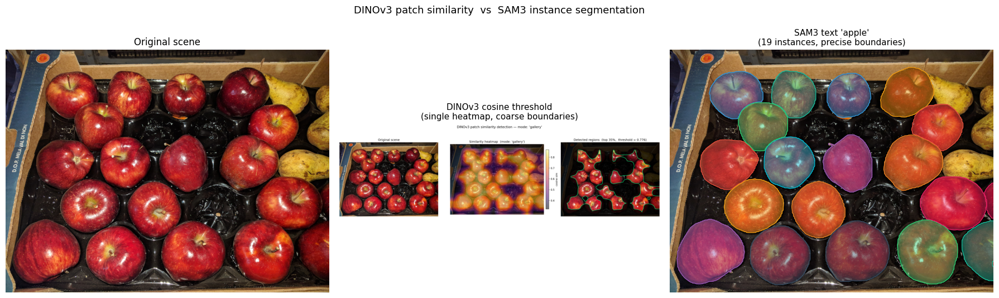

In [26]:
dino_mask_path = pathlib.Path("detection_gallery.png")

fig, axes = plt.subplots(1, 3, figsize=(18, 5.5))

axes[0].imshow(scene_arr)
axes[0].set_title("Original scene", fontsize=12)
axes[0].axis("off")

if dino_mask_path.exists():
    axes[1].imshow(Image.open(dino_mask_path))
    axes[1].set_title(
        "DINOv3 cosine threshold\n(single heatmap, coarse boundaries)", fontsize=11)
else:
    axes[1].text(0.5, 0.5, "Run DINOv3 notebook first\n(detection_gallery.png)",
                 ha="center", va="center", transform=axes[1].transAxes, fontsize=10)
    axes[1].set_title("DINOv3 (not available)", fontsize=11)
axes[1].axis("off")

axes[2].imshow(_color_overlay(scene_arr, dets))
for i, det in enumerate(dets):
    axes[2].contour(det["mask"].astype(float), levels=[0.5],
                    colors=[INSTANCE_COLORS[i % len(INSTANCE_COLORS)]], linewidths=0.9)
axes[2].set_title(
    f"SAM3 text '{TEXT_PROMPT}'\n({len(dets)} instances, precise boundaries)", fontsize=11)
axes[2].axis("off")

plt.suptitle("DINOv3 patch similarity  vs  SAM3 instance segmentation",
             fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig("sam3_vs_dinov3.png", dpi=150, bbox_inches="tight")
plt.show()

---
## Summary

### What SAM3 gives you that DINOv3 threshold segmentation cannot

1. **Instance separation** — each detected fruit gets its own binary mask; touching
   apples are separate objects, not one blob.
2. **Pixel-accurate boundaries** — the learned mask decoder recovers fine contours that
   the 14×14 DINOv3 patch grid fundamentally cannot represent.
3. **Calibrated confidence** — the IoU prediction score tells you *how certain the model
   is* about each mask, making automated filtering straightforward.
4. **No threshold tuning** — the text or visual prompt replaces the manual
   `SIM_PERCENTILE` knob; the score threshold has a consistent semantic meaning across
   scenes and classes.
5. **Open-vocabulary** — any English noun phrase works as a prompt; no retraining
   or adapter is required for new fruit classes.

### When DINOv3 patch similarity is still useful

- Extremely fast inference with no learned decoder overhead  
- Works with patch-level similarity for dense cross-image retrieval and patch matching  
- Produces a graded heatmap rather than a hard mask, useful for attention visualisation  
- Lower GPU memory footprint at batch scale